<a href="https://colab.research.google.com/github/toanchitran/CoderSchool_ML_IZU/blob/master/WeeklyProject_Team_5_Global_Terrorism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RISK ACCESS FOR GLOBAL TERRORISM

![](https://static.euronews.com/articles/stories/04/44/85/80/1440x810_cmsv2_42163f70-0149-51fc-91a2-6608636a809b-4448580.jpg)

_For more information about the dataset, read [here](https://www.kaggle.com/START-UMD/gtd)._


## Import dataset to Google Colab

In [1]:
#@title HELPER FUNCTION { run: "auto", display-mode: "form" }

import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd



!pip install --upgrade plotly

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

Requirement already up-to-date: plotly in /usr/local/lib/python3.6/dist-packages (4.13.0)


In [2]:

PATH_TO_DATA = 'https://media.githubusercontent.com/media/toanchitran/CoderSchool_ML_IZU/master/terrorism.csv'

In [3]:
import pandas as pd
dataframe = pd.read_csv(PATH_TO_DATA, encoding='ISO-8859-1')

In [4]:
# Drop un-neccessary column in dataframe

drop_col = ['approxdate', 'specificity','vicinity','location', 'region', 'country', 'doubtterr', 'alternative', 'alternative_txt', 'attacktype1','attacktype2', 'attacktype2_txt','attacktype3', 'attacktype3_txt'
,'targtype1', 'targsubtype1', 'targtype2', 'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'natlty1', 'corp2', 'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3', 'natlty3_txt',
'gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3', 'guncertain2', 'guncertain3', 'claimmode', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3', 'claimmode3', 'claimmode3_txt','compclaim', 'weaptype1', 'weapsubtype1', 'weaptype2', 'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt','weaptype3', 'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt','weaptype4', 'weaptype4_txt', 'weapsubtype4', 'weapsubtype4_txt', 'weapdetail', 'divert', 'kidhijcountry', 'ransomamtus', 'ransompaidus', 'ransomnote', 'addnotes', 'scite1', 'scite2', 'scite3',
 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'related', 'dbsource']

terrorism_df = dataframe.drop(columns=drop_col)

In [5]:
# Rename the name to more HUMAN UNDERSTANDING name

terrorism_df.rename(columns = {'iyear':'year',
                               'imonth':'month',
                               'iday':'day',
                               'country_txt':'country',
                               'region_txt':'region',
                               'resolution':'resolution_date',
                               'provstate':'province',
                               'multiple':'multiple_incident',
                               'success':'successful_attack',
                               'attacktype1_txt':'attack_type',
                               'targtype1_txt':'target_type',
                               'targsubtype1_txt':'target_subtype',
                               'corp1':'target_entity',
                               'target1':'target',
                               'natlty1_txt':'target_nationality',
                               'gname':'attacker',
                               'guncertain1':'attacker_uncertain',
                               'individual':'lone_wolf',
                               'nperps':'attacker_num',
                               'nperpcap':'captured_num',
                               'weaptype1_txt':'weapon_type',
                               'weapsubtype1_txt':'weapon_subtype',
                               'nkill':'fatality_num',
                               'nkillus':'US_fatality_num',
                               'nkillter':'attacker_fatality_num',
                               'nwound':'wounded_num',
                               'nwoundus':'US_wounded_num',
                               'nwoundte':'attacker_wounded_num',
                               'property':'property_damage',
                               'propextent':'property_damage_ext',
                               'propvalue':'property_damage_USD',
                               'ishostkid':'hostage',
                               'nhostkid':'hostage_num',
                               'nhostkidus':'US_hostage_num',
                               'nhours':'hostage_hours',
                               'ndays':'hostage_days',
                               'ransom':'ransom_demand',
                               'ransomamt':'ransom_demand_USD',
                               'ransompaid':'ransom_paid',
                               'hostkidoutcome':'hostage_outcome',
                               'hostkidoutcome_txt':'hostage_outcome_txt',
                               'nreleased':'hostage_survived_num',
                               'INT_ANY':'international_attack'
                               }, inplace = True)

In [6]:
terrorism_df.sample(5)

,eventid,year,month,day,extended,resolution_date,country,region,province,city,latitude,longitude,summary,crit1,crit2,crit3,multiple_incident,successful_attack,suicide,attack_type,target_type,target_subtype,target_entity,target,target_nationality,attacker,motive,attacker_uncertain,lone_wolf,attacker_num,captured_num,claimed,claimmode_txt,weapon_type,weapon_subtype,fatality_num,US_fatality_num,attacker_fatality_num,wounded_num,US_wounded_num,attacker_wounded_num,property_damage,property_damage_ext,propextent_txt,property_damage_USD,propcomment,hostage,hostage_num,US_hostage_num,hostage_hours,hostage_days,ransom_demand,ransom_demand_USD,ransom_paid,hostage_outcome,hostage_outcome_txt,hostage_survived_num,international_attack
35916,198810130001,1988,10,13,0,NaN,El Salvador,Central America & Caribbean,Cabanas,Ilobasco,13.850000,-88.850000,NaN,1,1,1,0.0,1,0,Bombing/Explosion,Utilities,Electricity,Electrical Co.,Power Line Pole,El Salvador,Farabundo Marti National Liberation Front (FMLN),NaN,0.0,0,NaN,NaN,NaN,NaN,Explosives,Unknown Explosive Type,0.0,NaN,NaN,0.0,NaN,NaN,1,3.0,Minor (likely < $1 million),3000.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0
155227,201511090007,2015,11,9,0,NaN,Jordan,Middle East & North Africa,Amman,Muwaqqar,31.796295,36.211077,11/09/2015: An assailant opened fire on police...,1,1,1,0.0,1,0,Armed Assault,Police,"Police Building (headquarters, station, school)",Jordanian International Police Training Centre...,Training Center,Jordan,Islamic State of Iraq and the Levant (ISIL),NaN,1.0,0,1.0,0.0,1.0,"Posted to website, blog, etc.",Firearms,Automatic or Semi-Automatic Rifle,6.0,2.0,1.0,7.0,2.0,0.0,-9,NaN,NaN,NaN,It is unknown if any property was damaged in t...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
39048,198907300001,1989,7,30,0,NaN,Colombia,South America,Bogota,Bogota,4.667128,-74.106056,NaN,0,1,1,0.0,1,0,Assassination,Private Citizens & Property,Labor Union Related,National Federation of Construction and Cement...,Pres. Henry Cuenca Vega,Colombia,Unknown,NaN,0.0,0,3.0,NaN,NaN,NaN,Firearms,Handgun,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,-9
52848,199209050022,1992,9,5,0,NaN,Peru,South America,Ayacucho,Ayacucho district,-14.318840,-74.378173,NaN,1,1,1,1.0,1,0,Armed Assault,Transportation,Bus (excluding tourists),NaN,Bus,Peru,Shining Path (SL),NaN,0.0,0,NaN,NaN,NaN,NaN,Incendiary,NaN,1.0,NaN,NaN,0.0,NaN,NaN,1,3.0,Minor (likely < $1 million),15000.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0
54590,199212170002,1992,12,17,0,NaN,Turkey,Middle East & North Africa,Diyarbakir,Unknown,38.109458,40.567051,NaN,1,1,1,0.0,1,0,Armed Assault,Transportation,Bus (excluding tourists),NaN,Commercial Minibus,Turkey,Kurdistan Workers' Party (PKK),NaN,0.0,0,NaN,NaN,NaN,NaN,Firearms,Automatic or Semi-Automatic Rifle,5.0,NaN,NaN,11.0,NaN,NaN,1,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0


## GLOBAL TREND OF TERRORISM OVER THE YEAR SINCE 1990
There has been a sudden spike in the number of terrorist attacks over the years. Following 1970 there has been a small rise in global terrorism however there a huge rise in terrorism post-2000. The curve seems to have a steep decline after 2017. which seems to be a good news.

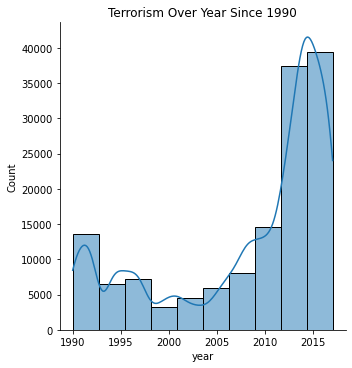

In [7]:
df = terrorism_df[terrorism_df.year >= 1990]
df.sort_values('year',ascending=True,inplace=True)

sns.displot(df.year,bins=10,palette='viridis', kde=True);
plt.title('Terrorism Over Year Since 1990')
plt.show()

### Number Of Terrorism Attacks In The World Over The Years

In [8]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

attack = terrorism_df.groupby(['year', 'region','country'], as_index=False)['eventid'].count()
attack.rename(columns={'eventid':'Number_Of_Attacks'}, inplace= True)
attack['Number_Of_Attacks'] = attack['Number_Of_Attacks'].astype(int)
attack=attack[attack['year']>=1990]

fig = px.scatter_geo(attack, 
                     size='Number_Of_Attacks', size_max=100,
                     hover_name='country',
                     locations = 'country',
                     locationmode = "country names",
                     projection="natural earth", 
                     animation_frame='year',
                     color='region',
                     color_continuous_scale = 'viridis',
                     height= 650)
fig.update_layout(
    title= "Terrorism Attacks over years since 1990",
    title_x = 0.5 )
iplot(fig)



### Countries affected by terrorism over the year since 1990

In [9]:
init_notebook_mode(connected=True)
configure_plotly_browser_state()
fig = px.choropleth(attack[attack['Number_Of_Attacks']>0],
                     hover_data=['Number_Of_Attacks','country'],
                     locations = 'country',
                     locationmode = "country names",
                     projection="natural earth", 
                     animation_frame='year',
                     color='country',
                     color_continuous_scale = 'viridis',
                     height= 650)
fig.update_layout(
    title= "Country Affected by Terrorism Attacks over years since 1990",
    title_x = 0.5 )
iplot(fig)


### Number of terrorism attacks over the year by regions

In [10]:


init_notebook_mode(connected=True)
configure_plotly_browser_state()
fig = px.bar(attack,
             x='region',
             y='Number_Of_Attacks',
             color='region',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'Number_Of_Attacks':'Number Of Attacks', 'year':'Year', 'region': 'In region'},
             height=650)
fig.update_layout(
    title='Number of terrorism attacks since 1990',
    title_x = 0.5 )
fig.show()

In [11]:
df = terrorism_df[['region', 'year', 'country', 'attack_type', 'eventid']]
df=df.groupby(['region', 'year', 'country', 'attack_type'], as_index=False)['eventid'].count()
df.rename(columns={'eventid':'number_of_incidents'}, inplace=True)
df = df[df['year'] >= 2000]
init_notebook_mode(connected=True)
configure_plotly_browser_state()
fig = px.sunburst(df,
                  path=['region','year','country','attack_type'],
                  values='number_of_incidents',
                  color_continuous_scale = 'viridis',
                  height = 650,
                  maxdepth=2)
fig.update_layout(
    title= 'Number of Terrorism Attack by Countries and Regions Since 2000',
    title_x = 0.5 )
fig.show()

### Number Of People Killed By Terrorism In The World Over The Year


In [12]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

kill = terrorism_df.groupby(['year', 'region','country'], as_index=False)['fatality_num'].sum()
kill.rename(columns={'fatality_num':'Number_Of_Kills'}, inplace= True)
kill['Number_Of_Kills'] = kill['Number_Of_Kills'].astype(float)
kill = kill[kill['year']>=1990]
fig = px.scatter_geo(kill, 
                     size='Number_Of_Kills', size_max=100,
                     hover_name='country',
                     locations = 'country',
                     locationmode = "country names",
                     projection="natural earth", 
                     animation_frame='year',
                     color ='region',
                     color_continuous_scale = 'viridis',
                     height = 650)
fig.update_layout(
    title= "Terrorism kills over years since 1990",
    title_x = 0.5 )
fig.show()

In [13]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

kill = kill[kill.year >= 1990]

fig = px.bar(kill,
             x='region',
             y='Number_Of_Kills',
             color ='region',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'Number_Of_Kills':'Number Of Fatality', 'year':'Year', 'region': 'In region'},
             height=650)

fig.update_layout(
    title='Number of fatality by terrorism since 1990 to 2017',
    title_x = 0.5 )
fig.show()

## TOP 10 AFFECTED COUNTRIES

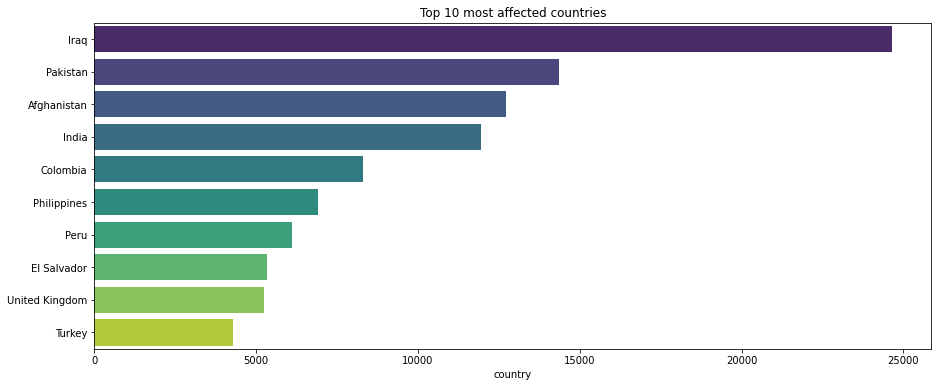

In [14]:

country=terrorism_df.country.value_counts().head(10)
plt.figure(figsize=(15,6))
bar = sns.barplot(country,country.index,palette='viridis').set_title("Top 10 most affected countries");

### Countries that took the highest number of terrorism since 1990

In [15]:
country_highest_attack = attack.groupby('country', as_index=False)['Number_Of_Attacks'].sum()
country_highest_attack.sort_values('Number_Of_Attacks', ascending=False, ignore_index=True).head(20)

,country,Number_Of_Attacks
0,Iraq,24600
1,Pakistan,14155
2,Afghanistan,12705
3,India,10708
4,Philippines,5866
5,Colombia,4936
6,Somalia,4124
7,Nigeria,3900
8,Thailand,3749
9,Turkey,3468


### Countries that took the lowsest number of terrorism since 1990

In [16]:
country_least_attack = attack.groupby('country', as_index=False)['Number_Of_Attacks'].sum()
country_least_attack.sort_values('Number_Of_Attacks', ignore_index=True).head(20)

,country,Number_Of_Attacks
0,Wallis and Futuna,1
1,Dominica,1
2,Antigua and Barbuda,1
3,St. Lucia,1
4,Guadeloupe,1
5,International,1
6,North Korea,1
7,Brunei,1
8,Barbados,1
9,Equatorial Guinea,2


## TERRORISM STATUS IN TOP 10 AFFECTED COUNTRIES 

In [17]:
#@title Top 10 affecteed countries

top10_country = terrorism_df[terrorism_df['country'].isin(country.index)]
top10_country = top10_country[top10_country.year >= 1990]


### TOP 20 terrorist groups in top 10 affected countries


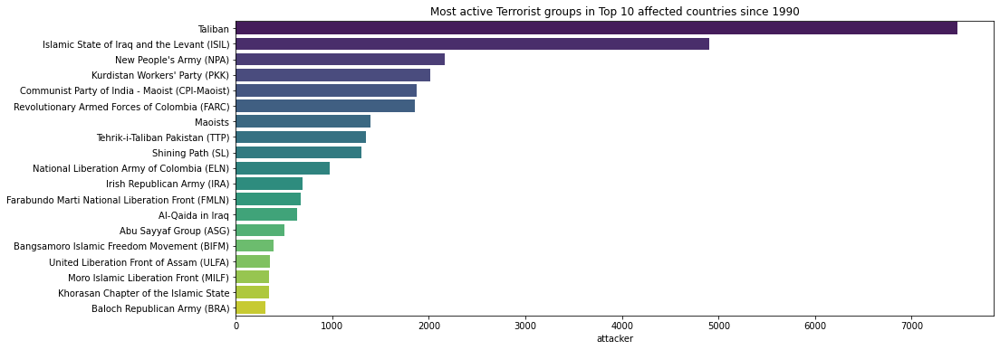

In [18]:
Group_name=top10_country.attacker.value_counts().head(20)
Group_name=Group_name[1:]

plt.figure(figsize=(15,6))
ax = plt.axes()
axs = sns.barplot(Group_name,Group_name.index,palette = "viridis").set_title('Most active Terrorist groups in Top 10 affected countries since 1990');


### TOP types of terrorism attack in top 10 affected countries

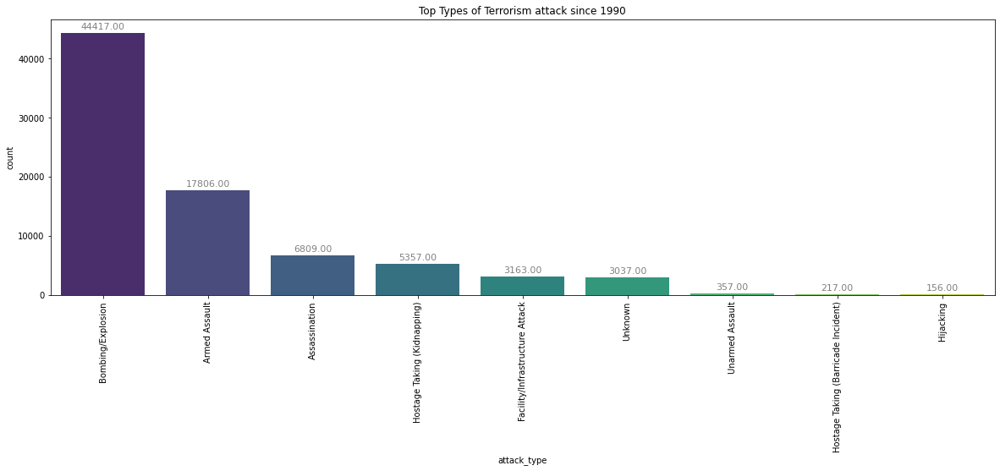

In [19]:
plt.figure(figsize=(20,6))
ax = plt.axes()
bar = sns.countplot('attack_type',data=top10_country,palette='viridis',order=top10_country['attack_type'].value_counts().index).set_title("Top Types of Terrorism attack since 1990")
plt.xticks(rotation=90);
for p in ax.patches:
             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='gray', xytext=(0,7),
                 textcoords='offset points')



### TOP target groups in top 10 affected countries

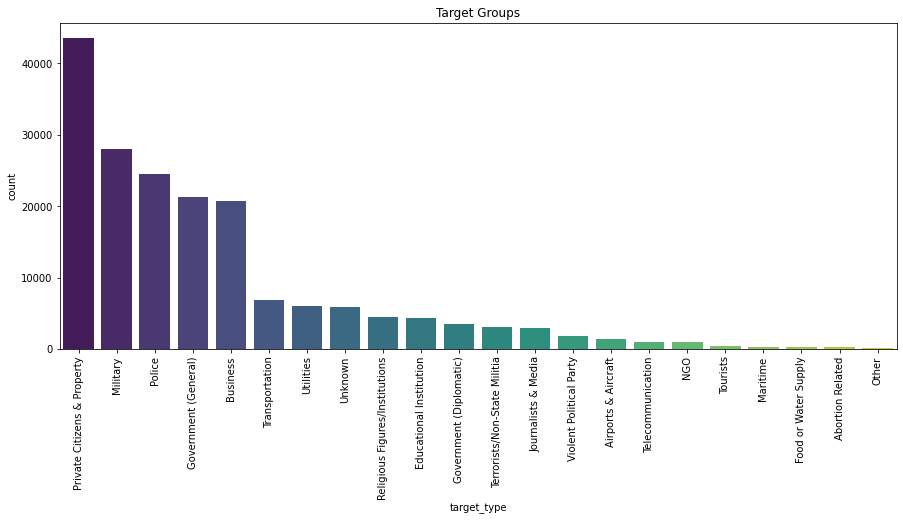

In [20]:
plt.subplots(figsize=(15,6))
sns.countplot(terrorism_df['target_type'],palette='viridis',order=terrorism_df['target_type'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Target Groups')
plt.show()

## HOSTAGE TAKEN INCIDENT TERRORISM

### Hostage incidents compared to all incidents

In [21]:
# make a new df containing only incidents involving hostages

hostage_incident_df = terrorism_df[(terrorism_df['hostage'] == 1) | (terrorism_df['attack_type'] == 4) | (terrorism_df['attack_type'] == 5) | (terrorism_df['attack_type'] == 6)].reset_index()

In [22]:
# proportion of total attacks that involve hostage taking

hostage_incidents = len(hostage_incident_df)
non_hostage_incidents = len(terrorism_df) - hostage_incidents

hostage_incidents_ransom = (hostage_incident_df['ransom_demand'] == 1).sum()
hostage_incidents_non_ransom = hostage_incidents - hostage_incidents_ransom 

ransom_paid = (hostage_incident_df['ransom_paid'] > 0).sum()
no_ransom_paid = hostage_incidents_ransom - ransom_paid

print(f"Non hostage incidents: {non_hostage_incidents} - Hostage incidents: {hostage_incidents} - No ransom: {hostage_incidents_non_ransom} - Ransom: {hostage_incidents_ransom} - Not paid: {no_ransom_paid} - Paid: {ransom_paid} ")


Non hostage incidents: 168119 - Hostage incidents: 13572 - No ransom: 12312 - Ransom: 1260 - Not paid: 1055 - Paid: 205 


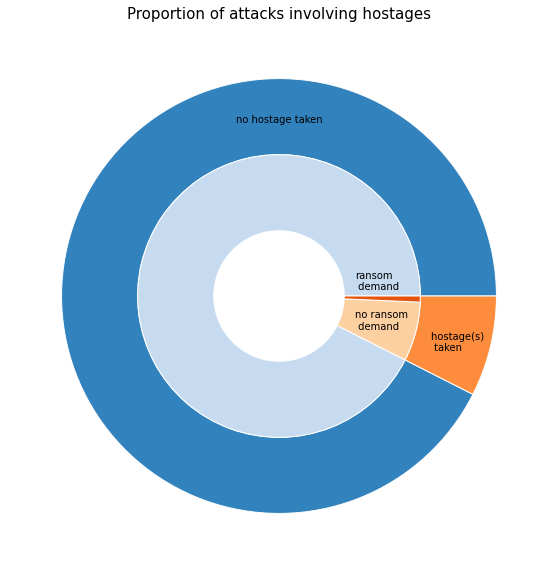

In [23]:
import numpy as np

# plot a nested pie chart

group1 = [non_hostage_incidents, hostage_incidents]
group2 = [non_hostage_incidents, hostage_incidents_non_ransom, hostage_incidents_ransom]


fig, ax = plt.subplots(figsize=(10, 10))
size = 0.35

cmap = plt.get_cmap("tab20c")
outer_colors = cmap(np.arange(2)*5)
inner_colors = cmap([3, 7, 4])

ax.pie(group1, radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'))

ax.pie(group2, radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labeldistance=1.5)


ax.annotate( 'no hostage taken', (-0.2, 0.8))
ax.annotate( 'hostage(s) \n taken', (0.7, -0.25))
ax.annotate( 'ransom\n demand', (0.35, 0.03))
ax.annotate( 'no ransom \n demand', (0.35, -0.15))

ax.set_title('Proportion of attacks involving hostages', fontsize=15)



plt.show()

A significant portion of terrorist attacks do not involve hostage taking.

A significant portion of hostage incidents do not demand ransom.

### Are hostage incidents increasing and which countries take the most hostages?

In [24]:
total_hostage_incidents_20 = hostage_incident_df.groupby('year')['eventid'].count().tail(20).tolist()
years = hostage_incident_df['year'].unique()[-20:]

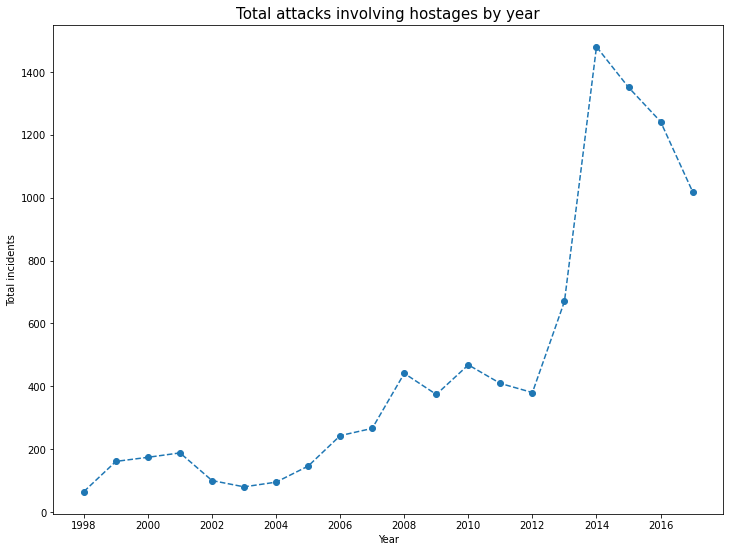

In [25]:
fig, ax = plt.subplots(figsize=(12,9))

ax.plot(years, total_hostage_incidents_20, '--o')
ax.set(xticks=range(years[0], years[-1], 2),
       xlabel='Year', 
       ylabel='Total incidents', 
       )

ax.set_title('Total attacks involving hostages by year', fontsize=15)


plt.show()

Hostage incidents have risen cosiderably in the last 20 years, with a big spike in 2014.

A closer look at the last 10 years:

In [26]:
# top countries where hostage incidents take place
top_hostage_takers_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] == 4) & (hostage_incident_df['year'] > 2007)].groupby('country')['eventid'].count().sort_values(ascending=False).head(20)
top_hostage_takers_non_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] != 4) & (hostage_incident_df['year'] > 2007)].groupby('country')['eventid'].count().sort_values(ascending=False).head(20)

In [27]:
top_hostage_takers = pd.merge(top_hostage_takers_non_fatality, top_hostage_takers_fatality, on='country').reset_index().head(10)
top_hostage_takers = top_hostage_takers.rename(columns={'eventid_x':'total_non_fatal',
                                                        'eventid_y':'total_fatal'})

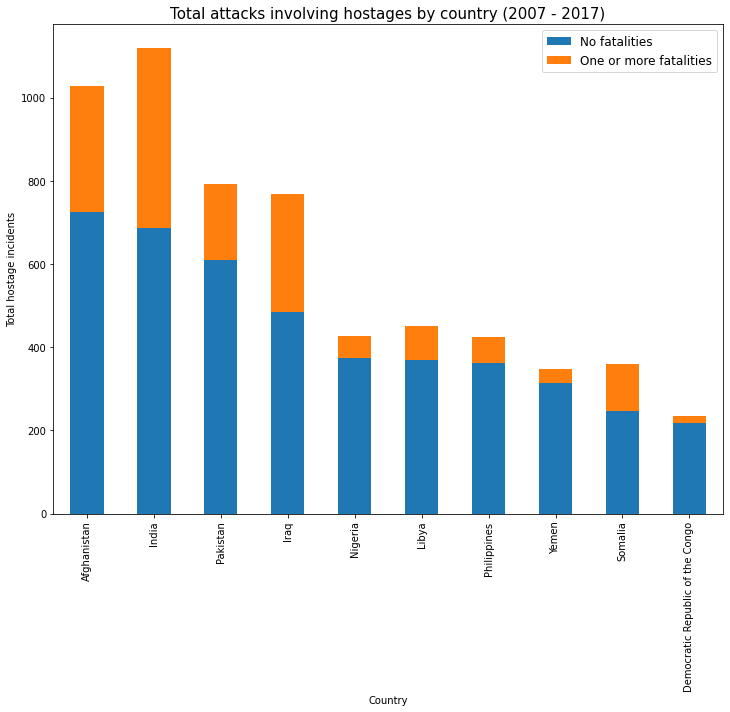

In [28]:
fig, ax = plt.subplots(figsize=(12,9))

top_hostage_takers.plot.bar(x='country', stacked=True, ax=ax)

ax.set(xlabel='Country', 
       ylabel='Total hostage incidents', 
       )

ax.set_title('Total attacks involving hostages by country (2007 - 2017)', fontsize=15)
ax.legend(['No fatalities', 'One or more fatalities'], fontsize=12)

plt.show()

The chances of survival in the countries that take the most captives during terrorist incidents very much depends on which country you are taken in. 

### Hostage incidents and ransom

In [29]:
top_ransom_demander_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] == 4) & (hostage_incident_df['year'] > 2007) & (hostage_incident_df['ransom_demand'] == 1)].groupby('attacker')['eventid'].count().sort_values(ascending=False).head(20)
top_ransom_demander_non_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] != 4) & (hostage_incident_df['year'] > 2007) & (hostage_incident_df['ransom_demand'] == 1)].groupby('attacker')['eventid'].count().sort_values(ascending=False).head(20)

In [30]:
top_ransom_demander = pd.merge(top_ransom_demander_non_fatality, top_ransom_demander_fatality, on='attacker').reset_index().head(5)
top_ransom_demander = top_ransom_demander.rename(columns={'eventid_x':'total_non_fatal',
                                                         'eventid_y':'total_fatal'})

In [31]:
top_ransom_demander_nat_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] == 4) & (hostage_incident_df['year'] > 2007) & (hostage_incident_df['ransom_demand'] == 1)].groupby('target_nationality')['eventid'].count().sort_values(ascending=False).head(20)
top_ransom_demander_nat_non_fatality = hostage_incident_df.loc[(hostage_incident_df['hostage_outcome'] != 4) & (hostage_incident_df['year'] > 2007) & (hostage_incident_df['ransom_demand'] == 1)].groupby('target_nationality')['eventid'].count().sort_values(ascending=False).head(20)

In [32]:
top_ransom_demander_nat = pd.merge(top_ransom_demander_nat_non_fatality, top_ransom_demander_nat_fatality, on='target_nationality').reset_index().head(5)
top_ransom_demander_nat = top_ransom_demander_nat.rename(columns={'eventid_x':'total_non_fatal',
                                                         'eventid_y':'total_fatal'})

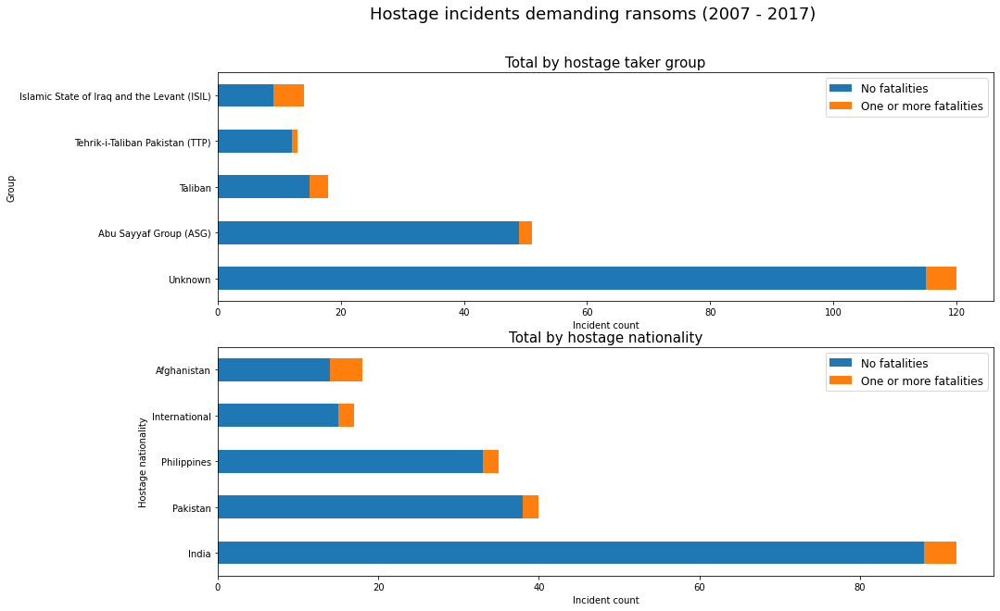

In [33]:
fig, axes = plt.subplots(2, 1, figsize=(15, 10))
fig.suptitle("Hostage incidents demanding ransoms (2007 - 2017)", fontsize=18)

top_ransom_demander.plot(x='attacker', kind='barh', ax=axes[0], stacked=True)
axes[0].set_title("Total by hostage taker group", fontsize=15)
axes[0].set_xlabel('Incident count')
axes[0].set_ylabel('Group')
axes[0].legend(['No fatalities', 'One or more fatalities'], fontsize=12)


top_ransom_demander_nat.plot(x='target_nationality', kind='barh', ax=axes[1], stacked=True)
axes[1].set_title("Total by hostage nationality", fontsize=15)
axes[1].set_xlabel('Incident count')
axes[1].set_ylabel('Hostage nationality')
axes[1].legend(['No fatalities', 'One or more fatalities'], fontsize=12)


plt.show()

### How much ransom money is demanded/paid?

In [34]:
# list of ransom demands after dropping NA and values listed as 0
ransom_demand_USD_df = hostage_incident_df[['eventid', 'year', 'target','month', 'day', 'attacker','hostage_num', 'hostage_hours', 'hostage_days', 'ransom_demand_USD', 'ransom_paid', 'hostage_outcome','hostage_survived_num']]
ransom_demand_USD_df = ransom_demand_USD_df[(ransom_demand_USD_df['ransom_demand_USD'] != -99) & (ransom_demand_USD_df['ransom_demand_USD'] > 0)]
ransom_paid_USD_df = ransom_demand_USD_df.loc[ransom_demand_USD_df['ransom_paid'] > 0]

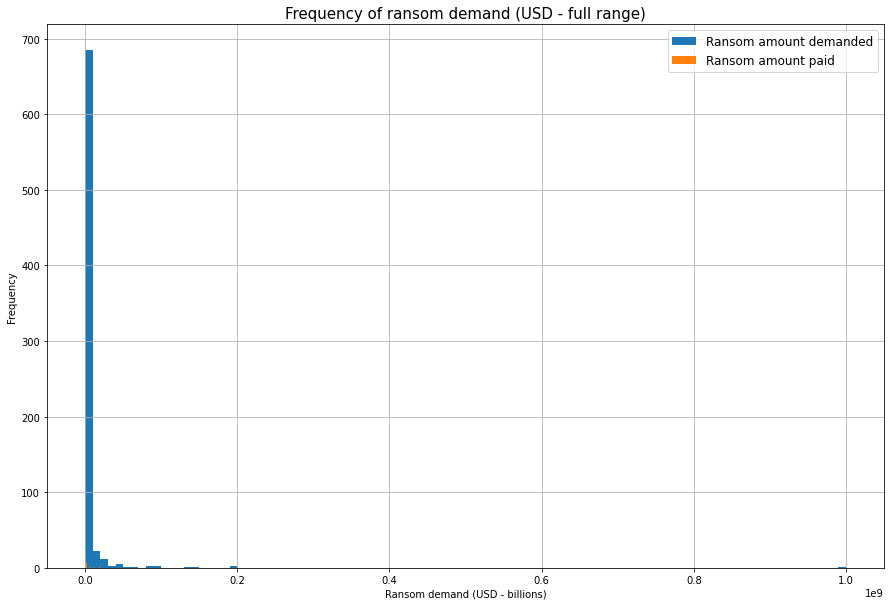

In [35]:
fig, ax = plt.subplots(figsize=(15, 10))

ransom_demand_USD_df.hist(column='ransom_demand_USD', bins = 100, ax=ax)
ransom_paid_USD_df.hist(column='ransom_paid', bins = 100, ax=ax)

ax.set_title('Frequency of ransom demand (USD - full range)', size=15)
ax.set_xlabel('Ransom demand (USD - billions)')
ax.set_ylabel('Frequency')

ax.legend(['Ransom amount demanded', 'Ransom amount paid'], fontsize=12)


plt.show()

Histogram is skewed by one rogue request for USD $1,000,000,000, by:

In [36]:
terrorism_df.loc[terrorism_df['ransom_demand_USD'].idxmax()][['attacker', 'year', 'country','target', 'ransom_demand_USD']]

attacker                                    Red Brigades
year                                                1978
country                                            Italy
target               Aldo Moro, former premier president
ransom_demand_USD                                  1e+09
Name: 6130, dtype: object

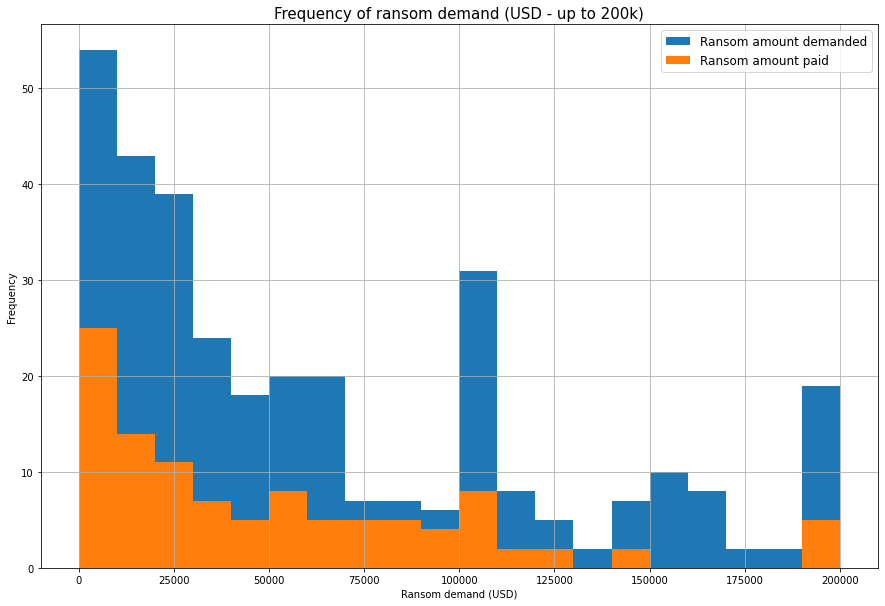

In [37]:
fig, ax = plt.subplots(figsize=(15, 10))

ransom_demand_USD_df.hist(column='ransom_demand_USD', bins = 20, range=[0,200000], ax=ax)
ransom_paid_USD_df.hist(column='ransom_paid', range=[0,200000], bins = 20, ax=ax)

ax.set_title('Frequency of ransom demand (USD - up to 200k)', size=15)
ax.set_xlabel('Ransom demand (USD)')
ax.set_ylabel('Frequency')

ax.legend(['Ransom amount demanded', 'Ransom amount paid'], fontsize=12)


plt.show()

Typically, most ransom demands are below USD $75,000. 

However, the amount actually paid to the abductees is typically lower and less frequent. 

### Does paying less than the requested amount of ransom decrease the chances of a successful release (no hostages killed)?



In [38]:
ransom_paid_USD_df['hostage_killed_num'] = ransom_paid_USD_df['hostage_num'] - ransom_paid_USD_df['hostage_survived_num']
ransom_paid_USD_df['hostage_killed'] = ransom_paid_USD_df['hostage_killed_num'].apply(lambda x: 'r' if x > 0 else 'g')

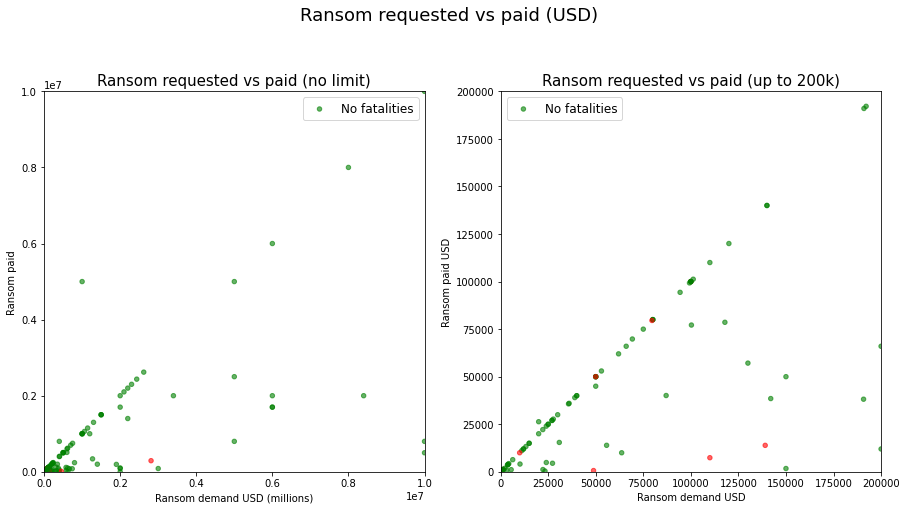

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
fig.suptitle('Ransom requested vs paid (USD)', fontsize=18)

ransom_paid_USD_df.plot.scatter('ransom_demand_USD', 'ransom_paid', c='hostage_killed', alpha=0.6, ax=axes[0])

axes[0].set_title('Ransom requested vs paid (no limit)', size=15)
axes[0].set_xlabel('Ransom demand USD (millions)')
axes[0].set_ylabel('Ransom paid')
axes[0].set_xlim([0, 10000000])
axes[0].set_ylim([0, 10000000])
axes[0].set_aspect('equal', 'box')
axes[0].legend(['No fatalities', 'One or more fatalities'], fontsize=12)


ransom_paid_USD_df.plot.scatter('ransom_demand_USD', 'ransom_paid', c='hostage_killed', alpha=0.6, ax=axes[1])

axes[1].set_title('Ransom requested vs paid (up to 200k)', size=15)
axes[1].set_xlabel('Ransom demand USD')
axes[1].set_ylabel('Ransom paid USD')
axes[1].set_xlim([0, 200000])
axes[1].set_ylim([0, 200000])
axes[1].set_aspect('equal', 'box')
axes[1].legend(['No fatalities', 'One or more fatalities'], fontsize=12)


plt.show()

In cases where ransom was demanded and paid, most demands were met. 

A handful of cases paid under the requested amount, and one case paid more. 

There doesn't seem to be a correlation between meeting the reqested amount and a successful outcome: hostages died when demands were met, and when they weren't. 

### What happens if you don't pay?

In [40]:
ransom_not_paid = hostage_incident_df[(hostage_incident_df['ransom_demand_USD'] > 0) & (hostage_incident_df['ransom_paid'] == 0)]
ransom_not_paid['hostage_killed_num'] = ransom_not_paid['hostage_num'] - ransom_not_paid['hostage_survived_num']

In [41]:
hostages_killed_per_incident_ransom_not_paid = (ransom_not_paid['hostage_killed_num'].count() / len(hostage_incident_df)) * 100

In [42]:
print(f"Chance of death in a hostage incident if the ransom isn't paid is {round(hostages_killed_per_incident_ransom_not_paid, 2)}%.")

Chance of death in a hostage incident if the ransom isn't paid is 1.1%.


In [43]:
hostages_killed_per_incident_ransom_paid = (ransom_paid_USD_df['hostage_killed_num'].count() / len(hostage_incident_df)) * 100

In [44]:
print(f"Chance of death in a hostage incident if the ransom isn't paid is {round(hostages_killed_per_incident_ransom_paid, 2)}%.")

Chance of death in a hostage incident if the ransom isn't paid is 1.08%.


The chances of a death in a hostage incident are quite low, regardless of ransom paid or not. 

### Caveat

Ransom data in this dataset was scant (~250 entries contained ransom dollar amounts of a dataset of ~180k rows). 

This is likely because when ransoms are paid, the payer (whether a government, corp or individual) is unlikely to, or discouraged from, publicising the act as to deter other hostage-takers. 

##  PROPERTY DAMAGED BY TERRORISM




In [45]:
#@title Property damage in top 10 most affected countries dataframe
property_damage_in_top_affect_country = top10_country[top10_country['property_damage'] != -9]
property_damage_in_top_affect_country = property_damage_in_top_affect_country.groupby(['country', 'year'], as_index=False).sum()
property_damage_in_top_affect_country = property_damage_in_top_affect_country[['property_damage', 'property_damage_USD', 'country', 'year']]

property_damage = terrorism_df[terrorism_df['property_damage'] != -9]
property_damage = property_damage[property_damage['year'] >= 1990]
property_damage = property_damage.groupby(['region', 'country', 'year'], as_index=False).sum()
property_damage = property_damage[['property_damage', 'property_damage_USD', 'region', 'country', 'year']]


### Properties Damaged Over The World By Terrorism By Region Since 1990

In [46]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

fig = px.bar(property_damage,
             x='region',
             y = 'property_damage',
             color ='region',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'property_damage':'Number Of Confirmed Propertied Damaged'},
             height= 650)
fig.update_layout(
    title='Number of Properties Damaged By Region Over The Year',
    title_x= 0.5)
fig.show()
        

In [47]:
init_notebook_mode(connected=True)
configure_plotly_browser_state()

avg_property_damage = property_damage.groupby('region', as_index=False).mean()
avg_property_damage.sort_values('property_damage', inplace=True)
fig = px.bar(avg_property_damage,
             x='region',
             y='property_damage',
             color ='region',
             color_continuous_scale = 'viridis',
             text='property_damage',
             height= 650)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Average Numbers Of Confirmed Properties by Region Damaged Per Year Since 1990',
    title_x= 0.5)
fig.show()

### Property damaged by countries

In [48]:
init_notebook_mode(connected=True)
configure_plotly_browser_state()

total_property_damage_by_country_USD= property_damage.groupby('country', as_index=False).sum()
total_property_damage_by_country_USD.sort_values('property_damage_USD', ascending= False, inplace=True)
fig = px.bar(total_property_damage_by_country_USD.head(10),
             x='country',
             y='property_damage_USD',
             color ='country',
             color_continuous_scale = 'viridis',
             text='property_damage_USD',
             height= 650)
fig.update_traces(texttemplate='%{text:2s}', textposition='outside')
fig.update_layout(
    title='Total Value Of Confirmed Properties Damaged by country Per Year Since 1990',
    title_x= 0.5)
fig.show()

In [49]:
init_notebook_mode(connected=True)
configure_plotly_browser_state()

avg_property_damage_by_country= property_damage.groupby('country', as_index=False).sum()
avg_property_damage_by_country.sort_values('property_damage', ascending=False, inplace=True)
fig = px.bar(avg_property_damage_by_country.head(20),
             x='country',
             y='property_damage',
             color ='country',
             color_continuous_scale = 'viridis',
             text='property_damage',
             height= 650)
fig.update_traces(texttemplate='%{text:2s}', textposition='outside')
fig.update_layout(
    title='Total Numbers Of Confirmed Properties Damaged by country Per Year Since 1990',
    title_x= 0.5)
fig.show()

### Number of properties damaged by terrorism in top 10 affected countries


Since 1990, Iraq is the country that have the most properties damaged by terrorism with the confirmed number of 8355. Even the United Kingdom is the country that have the most properties damaged in term of USD, the number of IK properties damaged by terrorism is only around 1224.



In [50]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

fig = px.bar(property_damage_in_top_affect_country,
             x='country',
             y = 'property_damage',
             color ='country',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'property_damage':'Number Of Confirmed Propertied Damaged'},
             text='property_damage',
             height= 650)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Number of Properties Damaged In Top 10 Affected Countries Over The Year',
    title_x= 0.5)
fig.show()
        

In [51]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

total_property_damage_in_top_affect_country = property_damage_in_top_affect_country.groupby('country', as_index=False).sum()
total_property_damage_in_top_affect_country.sort_values('property_damage', inplace=True)
fig = px.bar(total_property_damage_in_top_affect_country,
             x='country',
             y='property_damage',
             color ='country',
             color_continuous_scale = 'viridis',
             text='property_damage',
             height= 650)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Total Number Of Confirmed Properties Damaged In Top 10 Affected Countries Since 1990',
    title_x= 0.5)
fig.show()

In [52]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

avg_property_damage_in_top_affect_country = property_damage_in_top_affect_country.groupby('country', as_index=False).mean()
avg_property_damage_in_top_affect_country.sort_values('property_damage', inplace=True)
fig = px.bar(avg_property_damage_in_top_affect_country,
             x='country',
             y='property_damage',
             color ='country',
             color_continuous_scale = 'viridis',
             text='property_damage',
             height= 650)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Average Numbers Of Confirmed Properties Damaged In Top 10 Affected Countries Per Year Since 1990',
    title_x= 0.5)
fig.show()

### Property Damaged In USD 

In [53]:
init_notebook_mode(connected=True)
configure_plotly_browser_state()


property_damage['property_damage_USD'] = property_damage['property_damage_USD'].abs()

fig = px.bar(property_damage,
             x='region',
             y = 'property_damage_USD',
             color ='region',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'property_damage_USD':'Value Of Confirmed Propertied Damaged In USD'},
             height= 650)
fig.update_layout(
    title='Number of Properties Damaged In USD Over The Year By Region Since 1990',
    title_x= 0.5)
fig.show()

In [54]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

avg_property_damage = property_damage.groupby('region', as_index=False).mean()
avg_property_damage.sort_values('property_damage_USD', inplace=True)
fig = px.bar(
    avg_property_damage,
    x='region',
    y='property_damage_USD',
    color ='region',
    color_continuous_scale = 'viridis',
    labels={'property_damage_USD':'Average Value Of Confirmed Propertied Damaged In USD'},
    text = 'property_damage_USD'
    )
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Average Value Of Properties Damaged In USD Since 1990',
    title_x= 0.5)
fig.show()

### Property Damaged In USD In Top 10 Affected Countries

In [55]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()


property_damage_in_top_affect_country['property_damage_USD'] = property_damage_in_top_affect_country['property_damage_USD'].abs()

fig = px.bar(property_damage_in_top_affect_country,
             x='country',
             y = 'property_damage_USD',
             color ='country',
             color_continuous_scale = 'viridis',
             animation_frame='year',
             labels={'property_damage_USD':'Value Of Confirmed Propertied Damaged In USD'},
             text='property_damage_USD',
             height= 650)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Number of Properties Damaged In USD Over The Year',
    title_x= 0.5)
fig.show()

In [56]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

total_property_damage_in_top_affect_country_in_USD = property_damage_in_top_affect_country.groupby('country', as_index=False).sum()
total_property_damage_in_top_affect_country_in_USD.sort_values('property_damage_USD', inplace=True)
fig = px.bar(
    total_property_damage_in_top_affect_country_in_USD,
    x='country',
    y='property_damage_USD',
    color ='country',
    color_continuous_scale = 'viridis',
    labels={'property_damage_USD':'Value Of Confirmed Propertied Damaged In USD'},
    text='property_damage_USD'
    )
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Total Value Of Properties Damaged In USD Since 1990 In Top 10 Affected Country',
    title_x= 0.5)
fig.show()

In [57]:

init_notebook_mode(connected=True)
configure_plotly_browser_state()

avg_property_damage_in_top_affect_country_in_USD = property_damage_in_top_affect_country.groupby('country', as_index=False).mean()
avg_property_damage_in_top_affect_country_in_USD.sort_values('property_damage_USD', inplace=True)
fig = px.bar(
    avg_property_damage_in_top_affect_country_in_USD,
    x='country',
    y='property_damage_USD',
    color ='country',
    color_continuous_scale = 'viridis',
    labels={'property_damage_USD':'Average Value Of Confirmed Propertied Damaged In USD'},
    text = 'property_damage_USD'
    )
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title='Average Value Of Properties Damaged In USD Since 1990 In Top 10 Affected Country',
    title_x= 0.5)
fig.show()

The highest of avearge value of propery damaged by terrorism by region is arround 13M USD per year.
And UK is the country that take the highest damage because of terrorism in the world since 1990 with the average 150M USD per year

## BONUS: ARE WE SAFE TODAY?

In [58]:
terrorism_df['day'] = terrorism_df['day'].apply(lambda x: np.random.randint(1,32) if x == 0 else x)
terrorism_df['month'] = terrorism_df['month'].apply(lambda x: np.random.randint(1,13) if x == 0 else x)

terrorism_df['date'] = pd.to_datetime(terrorism_df[['year','month', 'day' ]], errors= 'coerce') #created a new column as merging year-month-day.
terrorism_df['date'] = pd.to_datetime(terrorism_df['date']) 
terrorism_df['day_of_week'] = terrorism_df['date'].dt.day_name() #a new columns as day of week. 


### Fatality Number by Region and Day of Week

Friday is the safest day in the 

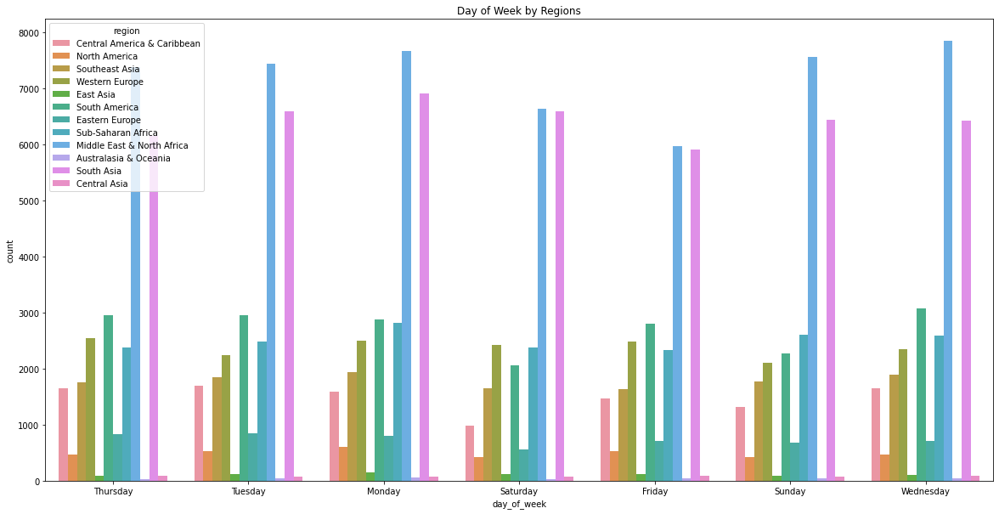

In [59]:
plt.figure(figsize=(20,10))
sns.countplot(x="day_of_week", hue="region", data=terrorism_df)
plt.title("Day of Week by Regions")
plt.show()

In [60]:
day_and_attack = terrorism_df.groupby('day_of_week', as_index=False)['eventid'].count()
day_and_attack.rename(columns={'eventid':'number_of_attack'}, inplace=True)


In [61]:
day_and_attack.sort_values('number_of_attack', inplace=True)

In [62]:
day_and_attack

,day_of_week,number_of_attack
2,Saturday,23914
0,Friday,24051
3,Sunday,25360
4,Thursday,26303
5,Tuesday,26842
6,Wednesday,27221
1,Monday,27988


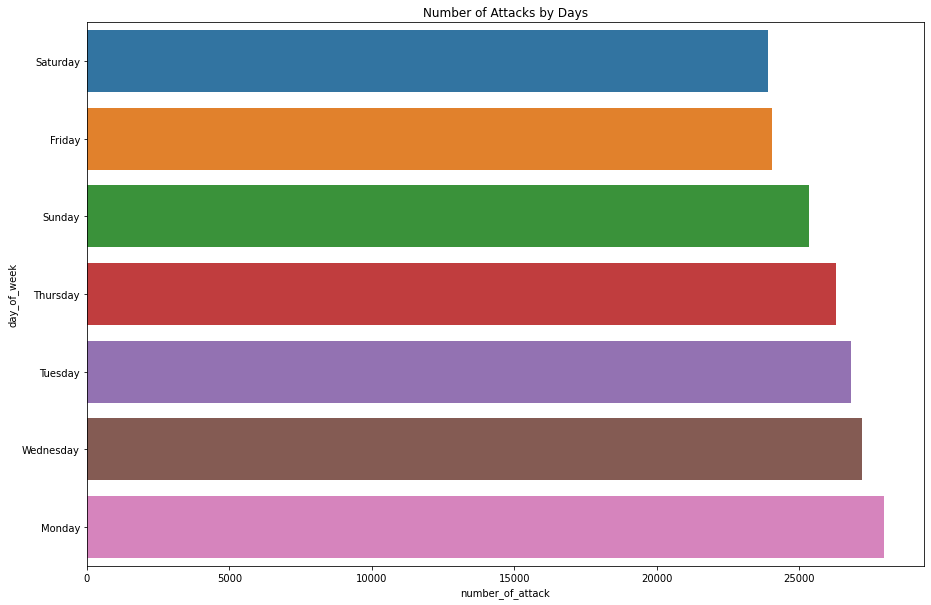

In [63]:
plt.figure(figsize=(15,10))
sns.barplot(y = 'day_of_week', x = 'number_of_attack', data = day_and_attack)
plt.title("Number of Attacks by Days")
plt.show()

In [64]:
day_and_death = terrorism_df.groupby('day_of_week', as_index=False)['fatality_num'].sum()
day_and_death.rename(columns={'fatality_num':'number_of_death'}, inplace=True)

In [65]:
day_and_death.sort_values('number_of_death', inplace=True)

In [66]:
day_and_death

,day_of_week,number_of_death
0,Friday,55988.0
2,Saturday,56798.0
6,Wednesday,58006.0
3,Sunday,59566.0
4,Thursday,59834.0
1,Monday,60670.0
5,Tuesday,61000.0


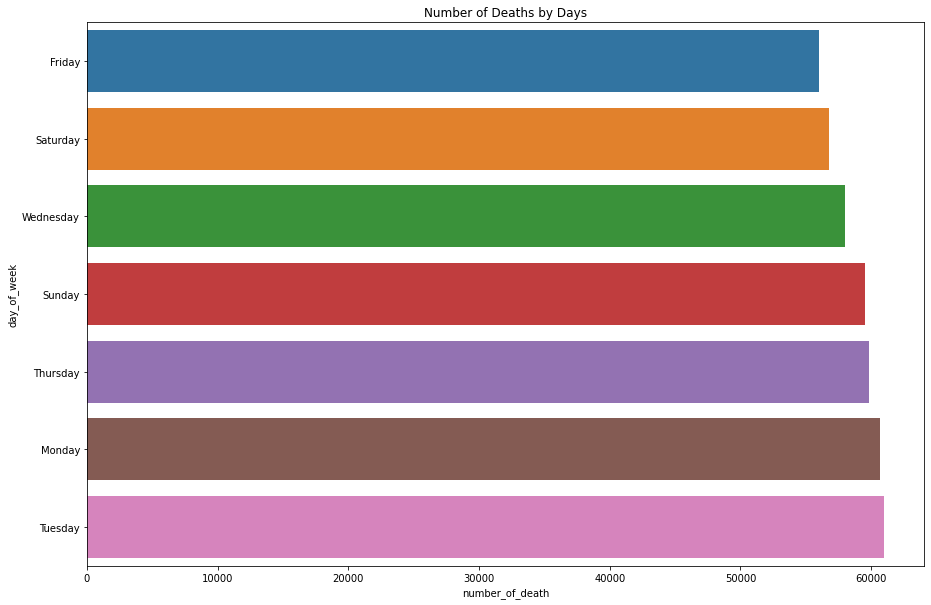

In [67]:
plt.figure(figsize=(15,10))
sns.barplot(y = 'day_of_week', x = 'number_of_death', data = day_and_death)
plt.title("Number of Deaths by Days")
plt.show()

## BONUS WHY TERRORISM?

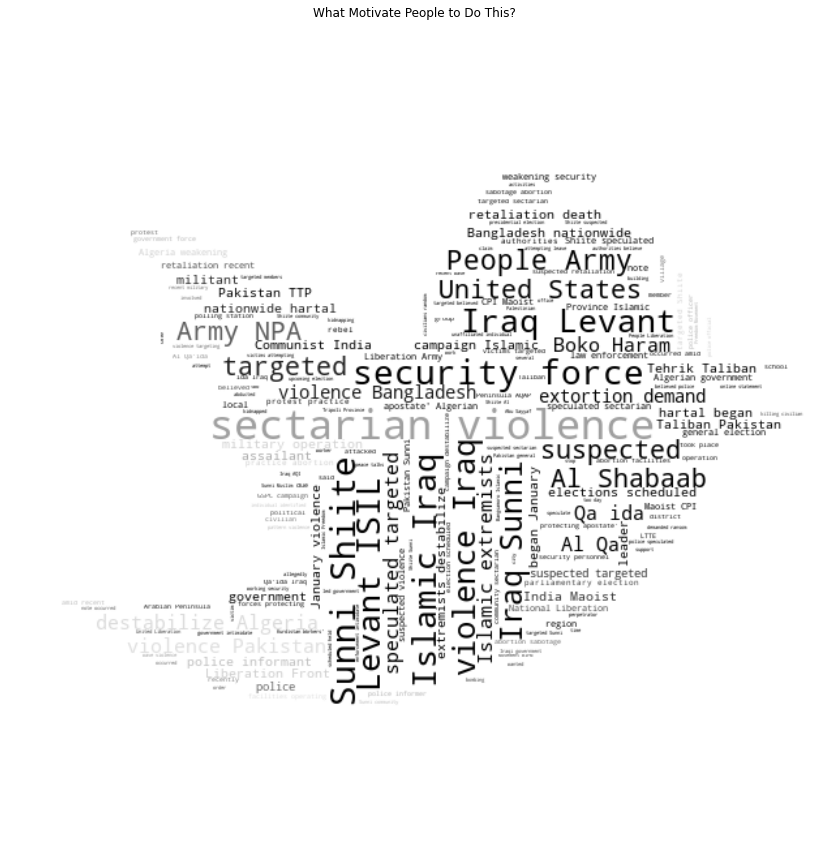

In [68]:
import numpy as np
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

text = dataframe.motive.dropna()
text = " ".join(str(motive) for motive in dataframe.motive )

stopwords = set(STOPWORDS)

stopwords.update(["say","NaN","specific" ,"carried","incident","responsibility","claimed","noted","minority", "nothing",
                  "party","Party","noted","attack","motive","source","sources","stated","part","new", "us","The", "specific", "motive", "for",
                  "attack", "is", "unknown", "which", "Unknown", "occured","Occured", "state", "reported", "member", "group", "area", "related", "intended",
                  "larger","trend","may","target","says","call","unknown","nan","NAN","majority","communities","victim", "killed" ,"people", "posited", "accused"])

mask = np.array(Image.open('/content/drive/MyDrive/M2jeo.jpg'))

wordcloud_usa = WordCloud(stopwords=stopwords, background_color="white", mode="RGBA",  max_words=100000000, mask=mask).generate(text)


image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[15,15])
plt.imshow( wordcloud_usa.recolor(color_func=image_colors),cmap=plt.cm.gist_heat, interpolation="bilinear")
plt.axis("off")
plt.title("What Motivate People to Do This?")
# store to file 
plt.savefig("motive_word.png", format="png")

plt.show()